In [1]:
import torch
import time
import warnings
import os
import sys
from numba.core.errors import NumbaWarning

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..")))

from device import setup_device
from datasets.loading import get_data_loaders
from model.loading import load_model
from train.train_encoder import train_encoder
from analysis.visualization import visualize
from analysis.extraction import (
    extract_embeddings_from_model,
    extract_all_embeddings_from_model
)
from utils.checkpoint import save_checkpoint
from utils.config_io import save_configuration
from utils.cleanup import clear_gpu_cache, run_gc
from utils.printing import print_verbose
from utils.seed import set_seed
from setup.test_dir_setup import setup_testing_directory
from setup.training_setup import setup_training_environment, setup_train_config

In [2]:
warnings.filterwarnings("ignore", message=".*force_all_finite.*")
warnings.filterwarnings("ignore", category=NumbaWarning)
warnings.filterwarnings("ignore", message=".*verbose parameter is deprecated.*")
warnings.filterwarnings("ignore", message=".*epoch parameter in `scheduler.step.*")

In [3]:
clear_gpu_cache()
run_gc()
set_seed(0)

[02:43:41] [INFO] 🧹 Cleared GPU cache.
[02:43:41] [INFO] 🗑️  Garbage collector freed 4433 objects.
[02:43:41] [INFO] 🌱 Random seed set to 0.


In [4]:
config = {
    'verbose': True,
    'use_gpu_1_only': False,
    
    'backbone_model': 'resnet18',
    'pretrained': False,
    
    'base_dir': '../outputs/current',
    'test_name': '200_epochs_resnet18',
    'initial_model_file_name': 'initial_model.pth',
    'best_model_file_name': 'best_model.pth',
    
    'data_folder': '../data/utkface/UTKFace',
    'augmentations': 'crop,flip,color,grayscale',
    
    'batch_size': 256,
    'train_size': 0.8,
    'num_epochs': 200,
    'learning_rate': 1e-3,
    'optimizer': 'sgd',
    'momentum': 0.9,
    'scheduler': 'cosine',
    'temperature': 2.0,
    
    'key_metric': 'train_loss',
    'mode': 'min',
    'save_best_model': True,
    'use_early_stopping': False,
    'patience': 10, # for early stopping
    'delta': 1e-4, # for early stopping
    'save_intermediate_models': True,
    'write_to_tensorboard': True,
    'training_metrics': [
        "val_loss", "embedding_norm",
        "embedding_variance", "knn_accuracy",
        "knr_error", "spearman",
        "kendall", "grad_norm", "lr"
    ],
    'nearest_neighbors': 5 # for knn or knr analysis
}

In [5]:
setup_testing_directory(config, create_unique_dir=True)
save_configuration(config)

[02:43:41] [INFO] ✅ Test directory created: ../outputs/current/200_epochs_resnet18_20250528_0243
[02:43:41] [INFO] 📝 Configuration saved to ../outputs/current/200_epochs_resnet18_20250528_0243/config.json


In [6]:
device, model, optimizer, scheduler, monitor = setup_training_environment(config)

train_loader, val_loader, train_loader_clean = get_data_loaders(
    config['data_folder'], config['augmentations'], 
    batch_size=config['batch_size'], train_size=config['train_size']
)

train_config = setup_train_config(
    device, model, optimizer, scheduler, monitor,
    train_loader, val_loader, train_loader_clean,
    config
)

[02:43:41] [INFO] ✅ CUDA is available: 2 GPU(s) visible
[02:43:41] [INFO] 🚀 Wrapping model in DataParallel over 2 GPUs
[02:43:41] [INFO] Enabled monitors: ['LoggingMonitor', 'OptimumMonitor', 'SaveModelMonitor', 'TensorboardMonitor']


In [7]:
# TRAINING CELL

# save initial model for comparison
save_checkpoint(model, config['initial_model_file'], epoch=0)

start_time = time.time()
train_encoder(train_config, verbose=config['verbose'])
end_time = time.time()

print_verbose(f"Training completed in: {end_time - start_time:.2f} seconds", config['verbose'])

[02:43:41] [INFO] Configuration check passed: 7 keys found.
[02:43:41] [INFO] Configuration check passed: 9 keys found.
[02:43:41] [INFO] Training on device: cuda


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.97batch/s]


[02:44:48] [INFO] [Epoch 1] train_loss: 5.2740 (min)
[02:44:48] [INFO] ✅ New best train_loss: 5.2740 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[02:45:55] [INFO] [Epoch 2] train_loss: 5.2675 (min)
[02:45:55] [INFO] ✅ New best train_loss: 5.2675 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[02:47:01] [INFO] [Epoch 3] train_loss: 5.2660 (min)
[02:47:01] [INFO] ✅ New best train_loss: 5.2660 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.18batch/s]


[02:48:09] [INFO] [Epoch 4] train_loss: 5.2650 (min)
[02:48:09] [INFO] ✅ New best train_loss: 5.2650 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.91batch/s]


[02:49:17] [INFO] [Epoch 5] train_loss: 5.2644 (min)
[02:49:17] [INFO] ✅ New best train_loss: 5.2644 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.85batch/s]


[02:50:24] [INFO] [Epoch 6] train_loss: 5.2625 (min)
[02:50:24] [INFO] ✅ New best train_loss: 5.2625 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[02:51:33] [INFO] [Epoch 7] train_loss: 5.2620 (min)
[02:51:33] [INFO] ✅ New best train_loss: 5.2620 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.95batch/s]


[02:52:40] [INFO] [Epoch 8] train_loss: 5.2599 (min)
[02:52:40] [INFO] ✅ New best train_loss: 5.2599 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.89batch/s]


[02:53:47] [INFO] [Epoch 9] train_loss: 5.2579 (min)
[02:53:47] [INFO] ✅ New best train_loss: 5.2579 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.41batch/s]


[02:54:54] [INFO] [Epoch 10] train_loss: 5.2556 (min)
[02:54:54] [INFO] ✅ New best train_loss: 5.2556 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.94batch/s]


[02:56:01] [INFO] [Epoch 11] train_loss: 5.2543 (min)
[02:56:01] [INFO] ✅ New best train_loss: 5.2543 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.14batch/s]


[02:57:08] [INFO] [Epoch 12] train_loss: 5.2518 (min)
[02:57:08] [INFO] ✅ New best train_loss: 5.2518 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.14batch/s]


[02:58:15] [INFO] [Epoch 13] train_loss: 5.2490 (min)
[02:58:15] [INFO] ✅ New best train_loss: 5.2490 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.23batch/s]


[02:59:21] [INFO] [Epoch 14] train_loss: 5.2463 (min)
[02:59:21] [INFO] ✅ New best train_loss: 5.2463 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.16batch/s]


[03:00:28] [INFO] [Epoch 15] train_loss: 5.2453 (min)
[03:00:28] [INFO] ✅ New best train_loss: 5.2453 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.15batch/s]


[03:01:35] [INFO] [Epoch 16] train_loss: 5.2429 (min)
[03:01:35] [INFO] ✅ New best train_loss: 5.2429 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.16batch/s]


[03:02:42] [INFO] [Epoch 17] train_loss: 5.2409 (min)
[03:02:42] [INFO] ✅ New best train_loss: 5.2409 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.12batch/s]


[03:03:49] [INFO] [Epoch 18] train_loss: 5.2373 (min)
[03:03:49] [INFO] ✅ New best train_loss: 5.2373 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[03:04:56] [INFO] [Epoch 19] train_loss: 5.2341 (min)
[03:04:56] [INFO] ✅ New best train_loss: 5.2341 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.88batch/s]


[03:06:04] [INFO] [Epoch 20] train_loss: 5.2304 (min)
[03:06:04] [INFO] ✅ New best train_loss: 5.2304 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[03:07:11] [INFO] [Epoch 21] train_loss: 5.2274 (min)
[03:07:11] [INFO] ✅ New best train_loss: 5.2274 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[03:08:19] [INFO] [Epoch 22] train_loss: 5.2231 (min)
[03:08:19] [INFO] ✅ New best train_loss: 5.2231 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[03:09:26] [INFO] [Epoch 23] train_loss: 5.2201 (min)
[03:09:26] [INFO] ✅ New best train_loss: 5.2201 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.14batch/s]


[03:10:34] [INFO] [Epoch 24] train_loss: 5.2167 (min)
[03:10:34] [INFO] ✅ New best train_loss: 5.2167 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[03:11:41] [INFO] [Epoch 25] train_loss: 5.2124 (min)
[03:11:41] [INFO] ✅ New best train_loss: 5.2124 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[03:12:48] [INFO] [Epoch 26] train_loss: 5.2089 (min)
[03:12:48] [INFO] ✅ New best train_loss: 5.2089 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[03:13:57] [INFO] [Epoch 27] train_loss: 5.2077 (min)
[03:13:57] [INFO] ✅ New best train_loss: 5.2077 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[03:15:05] [INFO] [Epoch 28] train_loss: 5.2011 (min)
[03:15:05] [INFO] ✅ New best train_loss: 5.2011 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[03:16:13] [INFO] [Epoch 29] train_loss: 5.2066 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[03:17:21] [INFO] [Epoch 30] train_loss: 5.1966 (min)
[03:17:21] [INFO] ✅ New best train_loss: 5.1966 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.11batch/s]


[03:18:29] [INFO] [Epoch 31] train_loss: 5.1979 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.94batch/s]


[03:19:36] [INFO] [Epoch 32] train_loss: 5.1925 (min)
[03:19:36] [INFO] ✅ New best train_loss: 5.1925 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[03:20:43] [INFO] [Epoch 33] train_loss: 5.1915 (min)
[03:20:44] [INFO] ✅ New best train_loss: 5.1915 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[03:21:51] [INFO] [Epoch 34] train_loss: 5.1858 (min)
[03:21:51] [INFO] ✅ New best train_loss: 5.1858 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[03:22:59] [INFO] [Epoch 35] train_loss: 5.1879 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[03:24:07] [INFO] [Epoch 36] train_loss: 5.1829 (min)
[03:24:07] [INFO] ✅ New best train_loss: 5.1829 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.45batch/s]


[03:25:14] [INFO] [Epoch 37] train_loss: 5.1829 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[03:26:23] [INFO] [Epoch 38] train_loss: 5.1775 (min)
[03:26:23] [INFO] ✅ New best train_loss: 5.1775 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.12batch/s]


[03:27:30] [INFO] [Epoch 39] train_loss: 5.1768 (min)
[03:27:30] [INFO] ✅ New best train_loss: 5.1768 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[03:28:38] [INFO] [Epoch 40] train_loss: 5.1723 (min)
[03:28:38] [INFO] ✅ New best train_loss: 5.1723 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.13batch/s]


[03:29:46] [INFO] [Epoch 41] train_loss: 5.1712 (min)
[03:29:46] [INFO] ✅ New best train_loss: 5.1712 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[03:30:54] [INFO] [Epoch 42] train_loss: 5.1727 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[03:32:04] [INFO] [Epoch 43] train_loss: 5.1707 (min)
[03:32:04] [INFO] ✅ New best train_loss: 5.1707 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[03:33:12] [INFO] [Epoch 44] train_loss: 5.1669 (min)
[03:33:12] [INFO] ✅ New best train_loss: 5.1669 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[03:34:19] [INFO] [Epoch 45] train_loss: 5.1630 (min)
[03:34:19] [INFO] ✅ New best train_loss: 5.1630 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.13batch/s]


[03:35:27] [INFO] [Epoch 46] train_loss: 5.1620 (min)
[03:35:27] [INFO] ✅ New best train_loss: 5.1620 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.14batch/s]


[03:36:35] [INFO] [Epoch 47] train_loss: 5.1581 (min)
[03:36:35] [INFO] ✅ New best train_loss: 5.1581 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[03:37:44] [INFO] [Epoch 48] train_loss: 5.1578 (min)
[03:37:44] [INFO] ✅ New best train_loss: 5.1578 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[03:38:51] [INFO] [Epoch 49] train_loss: 5.1562 (min)
[03:38:52] [INFO] ✅ New best train_loss: 5.1562 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.12batch/s]


[03:39:59] [INFO] [Epoch 50] train_loss: 5.1505 (min)
[03:39:59] [INFO] ✅ New best train_loss: 5.1505 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.12batch/s]


[03:41:07] [INFO] [Epoch 51] train_loss: 5.1524 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.11batch/s]


[03:42:15] [INFO] [Epoch 52] train_loss: 5.1516 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[03:43:23] [INFO] [Epoch 53] train_loss: 5.1491 (min)
[03:43:23] [INFO] ✅ New best train_loss: 5.1491 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[03:44:31] [INFO] [Epoch 54] train_loss: 5.1491 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[03:45:39] [INFO] [Epoch 55] train_loss: 5.1454 (min)
[03:45:39] [INFO] ✅ New best train_loss: 5.1454 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.13batch/s]


[03:46:47] [INFO] [Epoch 56] train_loss: 5.1420 (min)
[03:46:47] [INFO] ✅ New best train_loss: 5.1420 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.12batch/s]


[03:47:54] [INFO] [Epoch 57] train_loss: 5.1432 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[03:49:03] [INFO] [Epoch 58] train_loss: 5.1440 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[03:50:10] [INFO] [Epoch 59] train_loss: 5.1386 (min)
[03:50:11] [INFO] ✅ New best train_loss: 5.1386 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[03:51:18] [INFO] [Epoch 60] train_loss: 5.1344 (min)
[03:51:18] [INFO] ✅ New best train_loss: 5.1344 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[03:52:26] [INFO] [Epoch 61] train_loss: 5.1349 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.19batch/s]


[03:53:34] [INFO] [Epoch 62] train_loss: 5.1332 (min)
[03:53:34] [INFO] ✅ New best train_loss: 5.1332 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[03:54:41] [INFO] [Epoch 63] train_loss: 5.1314 (min)
[03:54:41] [INFO] ✅ New best train_loss: 5.1314 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[03:55:49] [INFO] [Epoch 64] train_loss: 5.1299 (min)
[03:55:49] [INFO] ✅ New best train_loss: 5.1299 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[03:56:57] [INFO] [Epoch 65] train_loss: 5.1250 (min)
[03:56:57] [INFO] ✅ New best train_loss: 5.1250 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.10batch/s]


[03:58:05] [INFO] [Epoch 66] train_loss: 5.1264 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.12batch/s]


[03:59:13] [INFO] [Epoch 67] train_loss: 5.1260 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.10batch/s]


[04:00:21] [INFO] [Epoch 68] train_loss: 5.1249 (min)
[04:00:21] [INFO] ✅ New best train_loss: 5.1249 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[04:01:29] [INFO] [Epoch 69] train_loss: 5.1219 (min)
[04:01:29] [INFO] ✅ New best train_loss: 5.1219 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[04:02:38] [INFO] [Epoch 70] train_loss: 5.1205 (min)
[04:02:38] [INFO] ✅ New best train_loss: 5.1205 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[04:03:46] [INFO] [Epoch 71] train_loss: 5.1181 (min)
[04:03:46] [INFO] ✅ New best train_loss: 5.1181 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.98batch/s]


[04:04:54] [INFO] [Epoch 72] train_loss: 5.1220 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[04:06:01] [INFO] [Epoch 73] train_loss: 5.1165 (min)
[04:06:01] [INFO] ✅ New best train_loss: 5.1165 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[04:07:09] [INFO] [Epoch 74] train_loss: 5.1171 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.49batch/s]


[04:08:17] [INFO] [Epoch 75] train_loss: 5.1159 (min)
[04:08:17] [INFO] ✅ New best train_loss: 5.1159 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.10batch/s]


[04:09:25] [INFO] [Epoch 76] train_loss: 5.1117 (min)
[04:09:25] [INFO] ✅ New best train_loss: 5.1117 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[04:10:33] [INFO] [Epoch 77] train_loss: 5.1126 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[04:11:40] [INFO] [Epoch 78] train_loss: 5.1097 (min)
[04:11:40] [INFO] ✅ New best train_loss: 5.1097 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[04:12:48] [INFO] [Epoch 79] train_loss: 5.1080 (min)
[04:12:48] [INFO] ✅ New best train_loss: 5.1080 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[04:13:57] [INFO] [Epoch 80] train_loss: 5.1047 (min)
[04:13:57] [INFO] ✅ New best train_loss: 5.1047 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.18batch/s]


[04:15:05] [INFO] [Epoch 81] train_loss: 5.1037 (min)
[04:15:05] [INFO] ✅ New best train_loss: 5.1037 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[04:16:12] [INFO] [Epoch 82] train_loss: 5.1018 (min)
[04:16:12] [INFO] ✅ New best train_loss: 5.1018 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[04:17:20] [INFO] [Epoch 83] train_loss: 5.1012 (min)
[04:17:20] [INFO] ✅ New best train_loss: 5.1012 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[04:18:28] [INFO] [Epoch 84] train_loss: 5.1030 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.11batch/s]


[04:19:35] [INFO] [Epoch 85] train_loss: 5.0962 (min)
[04:19:36] [INFO] ✅ New best train_loss: 5.0962 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[04:20:43] [INFO] [Epoch 86] train_loss: 5.0947 (min)
[04:20:43] [INFO] ✅ New best train_loss: 5.0947 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[04:21:51] [INFO] [Epoch 87] train_loss: 5.0968 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[04:22:59] [INFO] [Epoch 88] train_loss: 5.0952 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[04:24:06] [INFO] [Epoch 89] train_loss: 5.0954 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.96batch/s]


[04:25:15] [INFO] [Epoch 90] train_loss: 5.0920 (min)
[04:25:15] [INFO] ✅ New best train_loss: 5.0920 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[04:26:23] [INFO] [Epoch 91] train_loss: 5.0912 (min)
[04:26:23] [INFO] ✅ New best train_loss: 5.0912 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[04:27:31] [INFO] [Epoch 92] train_loss: 5.0868 (min)
[04:27:31] [INFO] ✅ New best train_loss: 5.0868 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.11batch/s]


[04:28:39] [INFO] [Epoch 93] train_loss: 5.0865 (min)
[04:28:39] [INFO] ✅ New best train_loss: 5.0865 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.11batch/s]


[04:29:47] [INFO] [Epoch 94] train_loss: 5.0863 (min)
[04:29:47] [INFO] ✅ New best train_loss: 5.0863 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[04:30:55] [INFO] [Epoch 95] train_loss: 5.0837 (min)
[04:30:55] [INFO] ✅ New best train_loss: 5.0837 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[04:32:03] [INFO] [Epoch 96] train_loss: 5.0828 (min)
[04:32:03] [INFO] ✅ New best train_loss: 5.0828 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[04:33:11] [INFO] [Epoch 97] train_loss: 5.0842 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[04:34:19] [INFO] [Epoch 98] train_loss: 5.0811 (min)
[04:34:19] [INFO] ✅ New best train_loss: 5.0811 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[04:35:27] [INFO] [Epoch 99] train_loss: 5.0786 (min)
[04:35:27] [INFO] ✅ New best train_loss: 5.0786 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[04:36:35] [INFO] [Epoch 100] train_loss: 5.0797 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[04:37:43] [INFO] [Epoch 101] train_loss: 5.0749 (min)
[04:37:43] [INFO] ✅ New best train_loss: 5.0749 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[04:38:50] [INFO] [Epoch 102] train_loss: 5.0766 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[04:39:58] [INFO] [Epoch 103] train_loss: 5.0746 (min)
[04:39:58] [INFO] ✅ New best train_loss: 5.0746 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[04:41:06] [INFO] [Epoch 104] train_loss: 5.0754 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[04:42:13] [INFO] [Epoch 105] train_loss: 5.0714 (min)
[04:42:13] [INFO] ✅ New best train_loss: 5.0714 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.11batch/s]


[04:43:21] [INFO] [Epoch 106] train_loss: 5.0685 (min)
[04:43:21] [INFO] ✅ New best train_loss: 5.0685 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[04:44:29] [INFO] [Epoch 107] train_loss: 5.0666 (min)
[04:44:29] [INFO] ✅ New best train_loss: 5.0666 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[04:45:36] [INFO] [Epoch 108] train_loss: 5.0711 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[04:46:44] [INFO] [Epoch 109] train_loss: 5.0638 (min)
[04:46:44] [INFO] ✅ New best train_loss: 5.0638 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[04:47:52] [INFO] [Epoch 110] train_loss: 5.0675 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[04:49:00] [INFO] [Epoch 111] train_loss: 5.0657 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[04:50:08] [INFO] [Epoch 112] train_loss: 5.0648 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.94batch/s]


[04:51:16] [INFO] [Epoch 113] train_loss: 5.0585 (min)
[04:51:16] [INFO] ✅ New best train_loss: 5.0585 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[04:52:24] [INFO] [Epoch 114] train_loss: 5.0616 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[04:53:32] [INFO] [Epoch 115] train_loss: 5.0570 (min)
[04:53:33] [INFO] ✅ New best train_loss: 5.0570 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[04:54:41] [INFO] [Epoch 116] train_loss: 5.0593 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[04:55:49] [INFO] [Epoch 117] train_loss: 5.0565 (min)
[04:55:49] [INFO] ✅ New best train_loss: 5.0565 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[04:56:57] [INFO] [Epoch 118] train_loss: 5.0546 (min)
[04:56:57] [INFO] ✅ New best train_loss: 5.0546 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[04:58:04] [INFO] [Epoch 119] train_loss: 5.0530 (min)
[04:58:04] [INFO] ✅ New best train_loss: 5.0530 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[04:59:13] [INFO] [Epoch 120] train_loss: 5.0552 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[05:00:21] [INFO] [Epoch 121] train_loss: 5.0534 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.10batch/s]


[05:01:29] [INFO] [Epoch 122] train_loss: 5.0506 (min)
[05:01:29] [INFO] ✅ New best train_loss: 5.0506 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.17batch/s]


[05:02:37] [INFO] [Epoch 123] train_loss: 5.0490 (min)
[05:02:37] [INFO] ✅ New best train_loss: 5.0490 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[05:03:45] [INFO] [Epoch 124] train_loss: 5.0493 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[05:04:53] [INFO] [Epoch 125] train_loss: 5.0461 (min)
[05:04:53] [INFO] ✅ New best train_loss: 5.0461 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[05:06:01] [INFO] [Epoch 126] train_loss: 5.0475 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[05:07:09] [INFO] [Epoch 127] train_loss: 5.0473 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[05:08:17] [INFO] [Epoch 128] train_loss: 5.0457 (min)
[05:08:17] [INFO] ✅ New best train_loss: 5.0457 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[05:09:25] [INFO] [Epoch 129] train_loss: 5.0422 (min)
[05:09:25] [INFO] ✅ New best train_loss: 5.0422 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[05:10:33] [INFO] [Epoch 130] train_loss: 5.0386 (min)
[05:10:33] [INFO] ✅ New best train_loss: 5.0386 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[05:11:41] [INFO] [Epoch 131] train_loss: 5.0422 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[05:12:49] [INFO] [Epoch 132] train_loss: 5.0395 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[05:13:57] [INFO] [Epoch 133] train_loss: 5.0389 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.98batch/s]


[05:15:05] [INFO] [Epoch 134] train_loss: 5.0390 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[05:16:13] [INFO] [Epoch 135] train_loss: 5.0377 (min)
[05:16:13] [INFO] ✅ New best train_loss: 5.0377 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[05:17:21] [INFO] [Epoch 136] train_loss: 5.0363 (min)
[05:17:21] [INFO] ✅ New best train_loss: 5.0363 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[05:18:29] [INFO] [Epoch 137] train_loss: 5.0341 (min)
[05:18:29] [INFO] ✅ New best train_loss: 5.0341 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[05:19:37] [INFO] [Epoch 138] train_loss: 5.0327 (min)
[05:19:37] [INFO] ✅ New best train_loss: 5.0327 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[05:20:45] [INFO] [Epoch 139] train_loss: 5.0336 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[05:21:53] [INFO] [Epoch 140] train_loss: 5.0278 (min)
[05:21:53] [INFO] ✅ New best train_loss: 5.0278 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[05:23:01] [INFO] [Epoch 141] train_loss: 5.0263 (min)
[05:23:01] [INFO] ✅ New best train_loss: 5.0263 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[05:24:09] [INFO] [Epoch 142] train_loss: 5.0292 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[05:25:17] [INFO] [Epoch 143] train_loss: 5.0268 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[05:26:25] [INFO] [Epoch 144] train_loss: 5.0266 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.10batch/s]


[05:27:32] [INFO] [Epoch 145] train_loss: 5.0271 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[05:28:40] [INFO] [Epoch 146] train_loss: 5.0229 (min)
[05:28:40] [INFO] ✅ New best train_loss: 5.0229 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[05:29:48] [INFO] [Epoch 147] train_loss: 5.0243 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[05:30:55] [INFO] [Epoch 148] train_loss: 5.0230 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.96batch/s]


[05:32:03] [INFO] [Epoch 149] train_loss: 5.0219 (min)
[05:32:04] [INFO] ✅ New best train_loss: 5.0219 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[05:33:12] [INFO] [Epoch 150] train_loss: 5.0223 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[05:34:20] [INFO] [Epoch 151] train_loss: 5.0179 (min)
[05:34:20] [INFO] ✅ New best train_loss: 5.0179 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[05:35:28] [INFO] [Epoch 152] train_loss: 5.0200 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[05:36:36] [INFO] [Epoch 153] train_loss: 5.0188 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.95batch/s]


[05:37:44] [INFO] [Epoch 154] train_loss: 5.0179 (min)
[05:37:44] [INFO] ✅ New best train_loss: 5.0179 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.98batch/s]


[05:38:53] [INFO] [Epoch 155] train_loss: 5.0167 (min)
[05:38:53] [INFO] ✅ New best train_loss: 5.0167 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[05:40:02] [INFO] [Epoch 156] train_loss: 5.0131 (min)
[05:40:02] [INFO] ✅ New best train_loss: 5.0131 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[05:41:10] [INFO] [Epoch 157] train_loss: 5.0168 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[05:42:18] [INFO] [Epoch 158] train_loss: 5.0113 (min)
[05:42:18] [INFO] ✅ New best train_loss: 5.0113 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[05:43:26] [INFO] [Epoch 159] train_loss: 5.0188 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[05:44:33] [INFO] [Epoch 160] train_loss: 5.0120 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[05:45:42] [INFO] [Epoch 161] train_loss: 5.0106 (min)
[05:45:42] [INFO] ✅ New best train_loss: 5.0106 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[05:46:51] [INFO] [Epoch 162] train_loss: 5.0108 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[05:47:58] [INFO] [Epoch 163] train_loss: 5.0073 (min)
[05:47:58] [INFO] ✅ New best train_loss: 5.0073 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[05:49:07] [INFO] [Epoch 164] train_loss: 5.0110 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[05:50:14] [INFO] [Epoch 165] train_loss: 5.0078 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[05:51:22] [INFO] [Epoch 166] train_loss: 5.0090 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[05:52:29] [INFO] [Epoch 167] train_loss: 5.0067 (min)
[05:52:30] [INFO] ✅ New best train_loss: 5.0067 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.01batch/s]


[05:53:38] [INFO] [Epoch 168] train_loss: 5.0072 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[05:54:45] [INFO] [Epoch 169] train_loss: 5.0009 (min)
[05:54:45] [INFO] ✅ New best train_loss: 5.0009 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[05:55:53] [INFO] [Epoch 170] train_loss: 5.0037 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.10batch/s]


[05:57:01] [INFO] [Epoch 171] train_loss: 5.0034 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[05:58:09] [INFO] [Epoch 172] train_loss: 5.0010 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.97batch/s]


[05:59:17] [INFO] [Epoch 173] train_loss: 5.0018 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[06:00:25] [INFO] [Epoch 174] train_loss: 4.9968 (min)
[06:00:25] [INFO] ✅ New best train_loss: 4.9968 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[06:01:33] [INFO] [Epoch 175] train_loss: 4.9979 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[06:02:41] [INFO] [Epoch 176] train_loss: 4.9955 (min)
[06:02:41] [INFO] ✅ New best train_loss: 4.9955 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[06:03:48] [INFO] [Epoch 177] train_loss: 4.9962 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.09batch/s]


[06:04:56] [INFO] [Epoch 178] train_loss: 4.9967 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[06:06:05] [INFO] [Epoch 179] train_loss: 4.9945 (min)
[06:06:05] [INFO] ✅ New best train_loss: 4.9945 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[06:07:16] [INFO] [Epoch 180] train_loss: 4.9982 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.00batch/s]


[06:08:23] [INFO] [Epoch 181] train_loss: 4.9966 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[06:09:31] [INFO] [Epoch 182] train_loss: 4.9912 (min)
[06:09:31] [INFO] ✅ New best train_loss: 4.9912 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[06:10:39] [INFO] [Epoch 183] train_loss: 4.9901 (min)
[06:10:39] [INFO] ✅ New best train_loss: 4.9901 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[06:11:47] [INFO] [Epoch 184] train_loss: 4.9886 (min)
[06:11:47] [INFO] ✅ New best train_loss: 4.9886 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[06:12:55] [INFO] [Epoch 185] train_loss: 4.9960 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.06batch/s]


[06:14:03] [INFO] [Epoch 186] train_loss: 4.9894 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[06:15:11] [INFO] [Epoch 187] train_loss: 4.9880 (min)
[06:15:11] [INFO] ✅ New best train_loss: 4.9880 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.97batch/s]


[06:16:19] [INFO] [Epoch 188] train_loss: 4.9901 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.07batch/s]


[06:17:26] [INFO] [Epoch 189] train_loss: 4.9870 (min)
[06:17:26] [INFO] ✅ New best train_loss: 4.9870 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.99batch/s]


[06:18:34] [INFO] [Epoch 190] train_loss: 4.9890 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.04batch/s]


[06:19:41] [INFO] [Epoch 191] train_loss: 4.9872 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.08batch/s]


[06:20:48] [INFO] [Epoch 192] train_loss: 4.9767 (min)
[06:20:48] [INFO] ✅ New best train_loss: 4.9767 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.10batch/s]


[06:21:57] [INFO] [Epoch 193] train_loss: 4.9835 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.16batch/s]


[06:23:05] [INFO] [Epoch 194] train_loss: 4.9815 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.02batch/s]


[06:24:13] [INFO] [Epoch 195] train_loss: 4.9836 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[06:25:22] [INFO] [Epoch 196] train_loss: 4.9832 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.03batch/s]


[06:26:30] [INFO] [Epoch 197] train_loss: 4.9829 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.12batch/s]


[06:27:38] [INFO] [Epoch 198] train_loss: 4.9784 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 8.05batch/s]


[06:28:46] [INFO] [Epoch 199] train_loss: 4.9823 (min)


Extracting Embeddings: 100%|██████████████████████████████| 75/75 [ 7.97batch/s]


[06:29:55] [INFO] [Epoch 200] train_loss: 4.9803 (min)
[06:29:55] [INFO] Training complete!
[06:29:55] [INFO] Training completed in: 13573.45 seconds


In [8]:
# ANALYSIS CELL

# Embedding extraction for visualization
initial_model_embeddings, initial_model_labels = extract_embeddings_from_model(
    model, config['initial_model_file'], config['data_folder'], device, config['verbose']
)
best_model_embeddings, best_model_labels = extract_embeddings_from_model(
    model, config['best_model_file'], config['data_folder'], device, config['verbose']
)
embeddings_list, labels_list = extract_all_embeddings_from_model(
    model, config['analysis_dir'], config['data_folder'],
    device, verbose=config['verbose']
)

# Parameters for visualization
vis_args = {
    'umap_data': [
        {'embeddings': initial_model_embeddings, 'labels': initial_model_labels, 
         'title': 'Initial Model UMAP Projection', 'figsize': (5, 5)},
        {'embeddings': best_model_embeddings, 'labels': best_model_labels, 
         'title': 'Best Model UMAP Projection', 'figsize': (5, 5)}
    ],
    'similarity_matrix_data': [
        {'embeddings': initial_model_embeddings, 'labels': initial_model_labels, 
         'title': 'Initial Model Feature Similarity Matrix', 'figsize': (5, 5)},
        {'embeddings': best_model_embeddings, 'labels': best_model_labels, 
         'title': 'Best Model Feature Similarity Matrix', 'figsize': (5, 5)}
    ],
    'umap_all_data': {
        'embeddings_list': embeddings_list,
        'labels_list': labels_list,
        'figsize': (3, 3),
        'max_cols': 5,
        'num_neighbors': 15
    }
}

# Visualizations to run
selected = ['umap', 'similarity_matrix', 'umap_all']

[06:29:55] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/initial_model.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.23batch/s]


[06:30:07] [INFO] Shape of embeddings: (23708, 128)
[06:30:07] [INFO] Memory usage of embeddings: 11.58 MB
[06:30:07] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/best_model.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.12batch/s]


[06:30:19] [INFO] Shape of embeddings: (23708, 128)
[06:30:19] [INFO] Memory usage of embeddings: 11.58 MB
[06:30:19] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_001.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.75batch/s]


[06:30:32] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_002.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.67batch/s]


[06:30:44] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_003.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.42batch/s]


[06:30:56] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_004.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.01batch/s]


[06:31:08] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_005.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.78batch/s]


[06:31:20] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_006.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.50batch/s]


[06:31:33] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_007.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.74batch/s]


[06:31:45] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_008.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.77batch/s]


[06:31:57] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_009.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.43batch/s]


[06:32:09] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_010.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [31.01batch/s]


[06:32:21] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_011.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [31.15batch/s]


[06:32:33] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_012.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.67batch/s]


[06:32:45] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_013.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [31.06batch/s]


[06:32:57] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_014.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [31.12batch/s]


[06:33:09] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_015.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.40batch/s]


[06:33:21] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_016.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.51batch/s]


[06:33:34] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_017.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.64batch/s]


[06:33:46] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_018.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.89batch/s]


[06:33:58] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_019.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.58batch/s]


[06:34:10] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_020.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.47batch/s]


[06:34:22] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_021.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.49batch/s]


[06:34:34] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_022.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.42batch/s]


[06:34:47] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_023.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.69batch/s]


[06:34:59] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_024.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.64batch/s]


[06:35:11] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_025.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.89batch/s]


[06:35:23] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_026.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.24batch/s]


[06:35:36] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_027.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.24batch/s]


[06:35:48] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_028.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.99batch/s]


[06:36:00] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_029.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.29batch/s]


[06:36:12] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_030.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.71batch/s]


[06:36:24] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_031.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.58batch/s]


[06:36:37] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_032.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.03batch/s]


[06:36:49] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_033.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.61batch/s]


[06:37:01] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_034.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.38batch/s]


[06:37:13] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_035.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.31batch/s]


[06:37:26] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_036.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.61batch/s]


[06:37:38] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_037.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.50batch/s]


[06:37:50] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_038.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.04batch/s]


[06:38:02] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_039.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.23batch/s]


[06:38:15] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_040.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.42batch/s]


[06:38:27] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_041.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.64batch/s]


[06:38:39] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_042.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.36batch/s]


[06:38:51] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_043.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.52batch/s]


[06:39:04] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_044.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.18batch/s]


[06:39:16] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_045.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [31.06batch/s]


[06:39:28] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_046.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.96batch/s]


[06:39:40] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_047.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.46batch/s]


[06:39:52] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_048.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.22batch/s]


[06:40:04] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_049.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.66batch/s]


[06:40:17] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_050.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.00batch/s]


[06:40:29] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_051.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.86batch/s]


[06:40:41] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_052.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.41batch/s]


[06:40:54] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_053.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.92batch/s]


[06:41:06] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_054.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.41batch/s]


[06:41:18] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_055.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.99batch/s]


[06:41:31] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_056.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.39batch/s]


[06:41:43] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_057.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.92batch/s]


[06:41:55] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_058.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.98batch/s]


[06:42:08] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_059.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.39batch/s]


[06:42:20] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_060.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.48batch/s]


[06:42:32] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_061.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.87batch/s]


[06:42:45] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_062.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.27batch/s]


[06:42:57] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_063.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.80batch/s]


[06:43:09] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_064.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.50batch/s]


[06:43:21] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_065.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.51batch/s]


[06:43:34] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_066.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.30batch/s]


[06:43:46] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_067.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.73batch/s]


[06:43:58] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_068.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.28batch/s]


[06:44:11] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_069.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.14batch/s]


[06:44:23] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_070.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.35batch/s]


[06:44:35] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_071.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.04batch/s]


[06:44:48] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_072.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.51batch/s]


[06:45:00] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_073.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.26batch/s]


[06:45:12] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_074.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.66batch/s]


[06:45:25] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_075.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.16batch/s]


[06:45:37] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_076.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.19batch/s]


[06:45:49] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_077.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.97batch/s]


[06:46:02] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_078.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.89batch/s]


[06:46:14] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_079.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.56batch/s]


[06:46:26] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_080.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.97batch/s]


[06:46:39] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_081.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.44batch/s]


[06:46:51] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_082.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.06batch/s]


[06:47:03] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_083.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.51batch/s]


[06:47:16] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_084.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.66batch/s]


[06:47:28] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_085.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.40batch/s]


[06:47:40] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_086.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.14batch/s]


[06:47:53] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_087.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.27batch/s]


[06:48:05] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_088.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.92batch/s]


[06:48:18] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_089.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.10batch/s]


[06:48:30] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_090.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.93batch/s]


[06:48:42] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_091.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.45batch/s]


[06:48:55] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_092.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.92batch/s]


[06:49:07] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_093.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.24batch/s]


[06:49:19] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_094.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.13batch/s]


[06:49:32] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_095.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.08batch/s]


[06:49:44] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_096.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.68batch/s]


[06:49:57] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_097.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.16batch/s]


[06:50:09] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_098.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.26batch/s]


[06:50:21] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_099.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.20batch/s]


[06:50:34] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_100.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.11batch/s]


[06:50:46] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_101.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.83batch/s]


[06:50:58] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_102.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.16batch/s]


[06:51:11] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_103.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.16batch/s]


[06:51:23] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_104.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.16batch/s]


[06:51:35] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_105.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.35batch/s]


[06:51:48] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_106.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.94batch/s]


[06:52:00] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_107.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.48batch/s]


[06:52:13] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_108.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.00batch/s]


[06:52:25] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_109.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.32batch/s]


[06:52:38] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_110.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.95batch/s]


[06:52:50] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_111.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [28.66batch/s]


[06:53:03] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_112.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.12batch/s]


[06:53:15] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_113.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.21batch/s]


[06:53:28] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_114.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.17batch/s]


[06:53:40] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_115.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.95batch/s]


[06:53:53] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_116.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.09batch/s]


[06:54:05] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_117.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.34batch/s]


[06:54:17] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_118.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.79batch/s]


[06:54:30] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_119.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.74batch/s]


[06:54:42] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_120.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.34batch/s]


[06:54:55] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_121.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.02batch/s]


[06:55:07] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_122.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.21batch/s]


[06:55:19] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_123.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.27batch/s]


[06:55:32] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_124.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.25batch/s]


[06:55:44] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_125.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.62batch/s]


[06:55:57] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_126.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.75batch/s]


[06:56:09] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_127.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.16batch/s]


[06:56:22] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_128.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.06batch/s]


[06:56:34] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_129.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.07batch/s]


[06:56:46] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_130.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.46batch/s]


[06:56:59] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_131.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.13batch/s]


[06:57:11] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_132.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.92batch/s]


[06:57:24] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_133.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.11batch/s]


[06:57:36] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_134.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.80batch/s]


[06:57:49] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_135.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.90batch/s]


[06:58:01] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_136.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.30batch/s]


[06:58:14] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_137.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.96batch/s]


[06:58:26] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_138.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.88batch/s]


[06:58:39] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_139.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.00batch/s]


[06:58:51] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_140.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.49batch/s]


[06:59:04] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_141.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.25batch/s]


[06:59:16] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_142.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.57batch/s]


[06:59:29] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_143.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.99batch/s]


[06:59:41] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_144.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.78batch/s]


[06:59:53] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_145.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.85batch/s]


[07:00:06] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_146.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.94batch/s]


[07:00:18] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_147.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.27batch/s]


[07:00:31] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_148.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [28.94batch/s]


[07:00:44] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_149.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.04batch/s]


[07:00:56] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_150.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.86batch/s]


[07:01:08] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_151.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.13batch/s]


[07:01:21] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_152.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.10batch/s]


[07:01:33] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_153.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.36batch/s]


[07:01:46] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_154.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.69batch/s]


[07:01:58] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_155.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.89batch/s]


[07:02:11] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_156.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.54batch/s]


[07:02:23] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_157.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.85batch/s]


[07:02:36] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_158.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.20batch/s]


[07:02:48] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_159.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.76batch/s]


[07:03:01] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_160.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.12batch/s]


[07:03:13] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_161.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.69batch/s]


[07:03:26] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_162.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.19batch/s]


[07:03:38] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_163.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.06batch/s]


[07:03:50] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_164.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.76batch/s]


[07:04:03] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_165.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.58batch/s]


[07:04:15] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_166.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.54batch/s]


[07:04:28] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_167.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.54batch/s]


[07:04:40] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_168.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.69batch/s]


[07:04:52] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_169.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.76batch/s]


[07:05:05] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_170.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.91batch/s]


[07:05:17] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_171.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.58batch/s]


[07:05:30] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_172.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.24batch/s]


[07:05:42] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_173.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.18batch/s]


[07:05:54] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_174.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.03batch/s]


[07:06:07] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_175.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.14batch/s]


[07:06:19] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_176.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.84batch/s]


[07:06:32] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_177.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.55batch/s]


[07:06:44] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_178.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.26batch/s]


[07:06:57] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_179.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.23batch/s]


[07:07:09] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_180.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.27batch/s]


[07:07:21] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_181.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.90batch/s]


[07:07:34] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_182.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.61batch/s]


[07:07:46] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_183.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.30batch/s]


[07:07:59] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_184.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.49batch/s]


[07:08:11] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_185.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.90batch/s]


[07:08:23] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_186.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.40batch/s]


[07:08:35] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_187.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.45batch/s]


[07:08:48] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_188.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.42batch/s]


[07:09:01] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_189.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.12batch/s]


[07:09:13] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_190.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.20batch/s]


[07:09:25] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_191.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.07batch/s]


[07:09:38] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_192.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [30.00batch/s]


[07:09:50] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_193.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.23batch/s]


[07:10:03] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_194.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.38batch/s]


[07:10:16] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_195.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.21batch/s]


[07:10:28] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_196.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.98batch/s]


[07:10:41] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_197.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.94batch/s]


[07:10:53] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_198.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.82batch/s]


[07:11:06] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_199.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.08batch/s]


[07:11:19] [INFO] Loaded model from ../outputs/current/200_epochs_resnet18_20250528_0243/analysis/model_epoch_200.pth


Extracting Embeddings: 100%|████████████████████████████| 371/371 [29.77batch/s]


[07:11:31] [INFO] [visualize] Running: umap
[07:11:53] [INFO] [plot_umap] embeddings: (23708, 128), labels: (23708,)


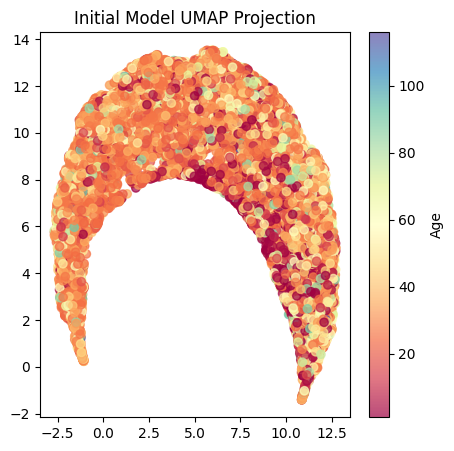

[07:12:01] [INFO] [plot_umap] embeddings: (23708, 128), labels: (23708,)


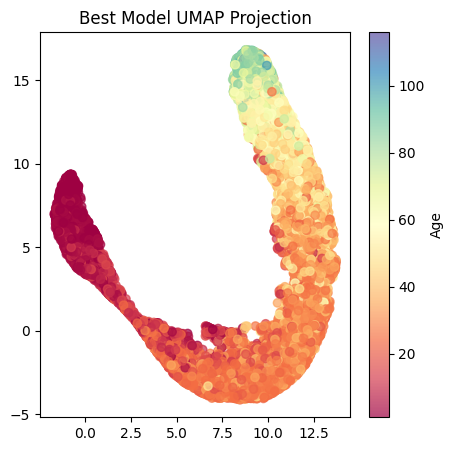

[07:12:01] [INFO] [visualize] Running: similarity_matrix
[07:12:02] [INFO] [plot_similarity_matrix] embeddings: torch.Size([2000, 128]), labels: torch.Size([2000])


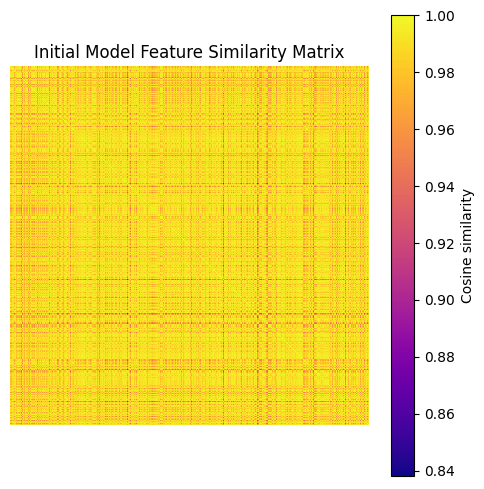

[07:12:03] [INFO] [plot_similarity_matrix] embeddings: torch.Size([2000, 128]), labels: torch.Size([2000])


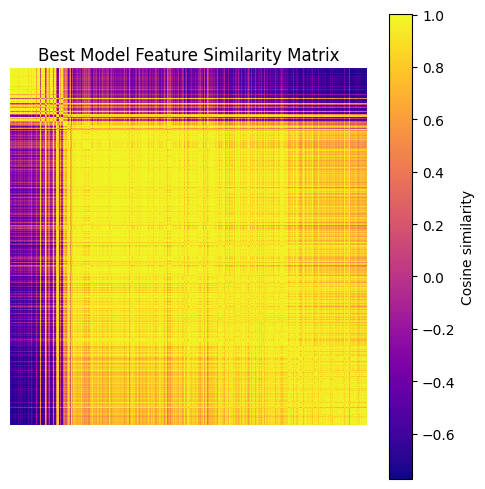

[07:12:03] [INFO] [visualize] Running: umap_all
[07:12:12] [INFO] [plot_umap_all_epochs_grid] Epoch 0: (23708, 128), (23708,)
[07:12:21] [INFO] [plot_umap_all_epochs_grid] Epoch 1: (23708, 128), (23708,)
[07:12:29] [INFO] [plot_umap_all_epochs_grid] Epoch 2: (23708, 128), (23708,)
[07:12:38] [INFO] [plot_umap_all_epochs_grid] Epoch 3: (23708, 128), (23708,)
[07:12:46] [INFO] [plot_umap_all_epochs_grid] Epoch 4: (23708, 128), (23708,)
[07:12:55] [INFO] [plot_umap_all_epochs_grid] Epoch 5: (23708, 128), (23708,)
[07:13:03] [INFO] [plot_umap_all_epochs_grid] Epoch 6: (23708, 128), (23708,)
[07:13:12] [INFO] [plot_umap_all_epochs_grid] Epoch 7: (23708, 128), (23708,)
[07:13:20] [INFO] [plot_umap_all_epochs_grid] Epoch 8: (23708, 128), (23708,)
[07:13:28] [INFO] [plot_umap_all_epochs_grid] Epoch 9: (23708, 128), (23708,)
[07:13:37] [INFO] [plot_umap_all_epochs_grid] Epoch 10: (23708, 128), (23708,)
[07:13:45] [INFO] [plot_umap_all_epochs_grid] Epoch 11: (23708, 128), (23708,)
[07:13:53] [IN

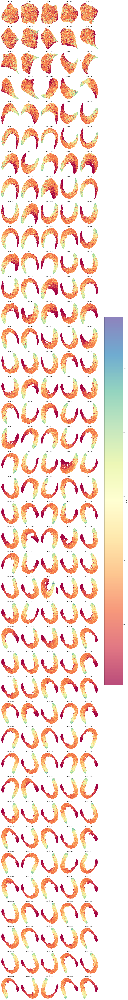

[07:39:31] [INFO] Visualization computed in: 1679.92 seconds


In [9]:
# VISUALIZATION CELL

start_time = time.time()
visualize(selected, vis_args, verbose=config['verbose'])
end_time = time.time()

print_verbose(f"Visualization computed in: {end_time - start_time:.2f} seconds", config['verbose'])